In [1]:
# General Imports
import numpy as np

# Visualisation Imports
import matplotlib.pyplot as plt

# Scikit Imports
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Qiskit Imports
from qiskit import Aer, execute, IBMQ
from qiskit.circuit import QuantumCircuit, Parameter, ParameterVector
from qiskit.circuit.library import PauliFeatureMap, ZFeatureMap, ZZFeatureMap
from qiskit.circuit.library import TwoLocal, NLocal, RealAmplitudes, EfficientSU2
from qiskit.circuit.library import HGate, RXGate, RYGate, RZGate, CXGate, CRXGate, CRZGate
from qiskit_machine_learning.kernels import QuantumKernel

In [2]:
# IBMQ.save_account("KEY", overwrite=True)
# IBMQ.load_account()

In [3]:
def get_backend(backend = "sim"):
    def get():
        if backend == "sim":
            return Aer.get_backend('statevector_simulator')
        provider = IBMQ.get_provider(hub = 'ibm-q')
        provider.backends()
        if backend == "real_sim":
            return provider.get_backend('simulator_mps')
        if backend == "real":
            return provider.get_backend('ibmq_belem')
    provider = get()
    d= provider.configuration().to_dict()
    print(f"Selected backend '{d['backend_name']}' max_qubits {d['n_qubits']}")
    return provider

backend= get_backend()

Selected backend 'statevector_simulator' max_qubits 30


In [4]:
def prepare_dataset(x, y, n_qubits, test_size_split=0.3, train_size = None, test_size = None):
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=test_size_split, random_state=49)

    if x_train.shape[1] > n_qubits:
        pca = PCA(n_components=n_qubits).fit(x_train)
        x_train = pca.transform(x_train)
        x_test = pca.transform(x_test)

    # Normalise
    std_scale = StandardScaler().fit(x_train)
    x_train = std_scale.transform(x_train)
    x_test = std_scale.transform(x_test)

    # Scale
    samples = np.append(x_train, x_test, axis=0)
    minmax_scale = MinMaxScaler((-1, 1)).fit(samples)
    x_train = minmax_scale.transform(x_train)
    x_test = minmax_scale.transform(x_test)

    if train_size:
        x_train = x_train[:train_size]
        y_train = y_train[:train_size]

    if test_size:
        x_test = x_test[:test_size]
        y_test = y_test[:test_size]

    return x_train, x_test, y_train, y_test

In [5]:
def draw_matrices(matrix_train, matrix_test, title = ""):
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(np.asmatrix(matrix_train), interpolation='nearest', origin='upper', cmap='Blues')
    axs[0].set_title("training kernel matrix")
    axs[1].imshow(np.asmatrix(matrix_test), interpolation='nearest', origin='upper', cmap='Reds')
    axs[1].set_title("testing kernel matrix")
    fig.suptitle(title)
    plt.show()

In [6]:
def calculate_matrices(backend, sample_train, sample_test, reps = 2, entanglement='linear', feature_map='ZZFeatureMap', **kwargs):
    if feature_map == 'ZZFeatureMap':
        zz_map = ZZFeatureMap(feature_dimension=sample_train.shape[1], reps=reps, entanglement=entanglement, insert_barriers=True)
    elif feature_map == 'PauliFeatureMap':
        zz_map = PauliFeatureMap(feature_dimension=sample_train.shape[1], reps=reps, entanglement=entanglement, paulis = ['X', 'ZXZ'], insert_barriers=True)
    
    zz_kernel = QuantumKernel(feature_map=zz_map, quantum_instance=backend)

    matrix_train = zz_kernel.evaluate(x_vec=sample_train)
    matrix_test = zz_kernel.evaluate(x_vec=sample_test, y_vec=sample_train)

    return matrix_train, matrix_test

In [7]:
import qiskit.tools.jupyter
%qiskit_job_watcher

Accordion(children=(VBox(layout=Layout(max_width='710px', min_width='710px')),), layout=Layout(max_height='500…

<IPython.core.display.Javascript object>

In [8]:
def make_experiment(backend, dataset_fn, qubits = 5, reps = 3, entanglement='linear', sort = False, draw = False, classic_svc = False, feature_map='ZZFeatureMap', **kwargs):
    x,y = dataset_fn()
    sample_train, sample_test, label_train, label_test = prepare_dataset(x,y, qubits, 0.3)

    if sort:
        indexes = np.argsort(label_train)
        sample_train =sample_train[indexes]
        label_train =label_train[indexes]

        indexes = np.argsort(label_test)
        sample_test =sample_test[indexes]
        label_test =label_test[indexes]
    
    matrix_train, matrix_test = calculate_matrices(backend, sample_train, sample_test, feature_map=feature_map,reps=reps, entanglement=entanglement)
    if draw:
        draw_matrices(matrix_train ,matrix_test, f"Qubits {qubits} reps{reps}")
    
    zzpc_svc = SVC(kernel='precomputed')
    zzpc_svc.fit(matrix_train, label_train)

    classic_svc_result = None
    if classic_svc:
        svc = SVC()
        svc.fit(sample_train, label_train)
        classic_svc_result = svc.score(sample_test, label_test)

    return matrix_train, label_train, zzpc_svc.score(matrix_test, label_test), classic_svc_result

In [9]:
import plotly.express as px

def digits_dataset():
    digits = datasets.load_digits(n_class=2)
    return digits.data, digits.target

def cancer_dataset():
    data = datasets.load_breast_cancer()
    return data.data, data.target

from itertools import combinations_with_replacement
def generate_mod_2(count, d=2):
    x = np.asarray(list(combinations_with_replacement(range(count), d)))
    y = [ (v[0]+v[1])%2  for v in x]
    return x.reshape(-1,d), np.array(y)

def curve_shapes(count):
    width = 10
    
    x_1 = np.linspace(-width, width, count)
    x_2 = (x_1)**2 + (np.random.rand(count)-0.5)*width
    x = np.array(list(zip(x_1, x_2)))
    y = [0]*len(x)

    x_1 = np.linspace(0, 2*width, count)
    x_2 = -(x_1-width)**2 + (width+1)**2 + (np.random.rand(count)-0.5)*width
    x = np.append(x, np.array(list(zip(x_1, x_2))))
    y = np.append(y, [1]*len(x_2))
    return x.reshape((2*count, 2)),y


# x,y = datasets.make_blobs(n_samples=400,n_features=2,centers=2,random_state=2)
# fig = px.scatter(x=list(x.T[0]), y=list(x.T[1]), color=y, color_continuous_scale='portland')
# fig.show()

# x,y = datasets.make_circles(n_samples=400,noise=0.001)
# fig = px.scatter(x=list(x.T[0]), y=list(x.T[1]), color=y, color_continuous_scale='portland')
# fig.show()

all_datasets = [("digits_dataset", digits_dataset), 
                ("cancer_dataset", cancer_dataset), 
                ("generate 16,2", lambda : generate_mod_2(16, 2)), 
                ("generate 14,3", lambda : generate_mod_2(14, 3)), 
                ("generate 12,4", lambda : generate_mod_2(12, 4)), 
                # ("generate 10,5", lambda : generate_mod_2(10, 5)),
                # ("generate 5,7", lambda : generate_mod_2(9, 7)),
                ("curve_shapes 300", lambda : curve_shapes(300)),
                ("blobs 400,2", lambda : datasets.make_blobs(n_samples=400,n_features=2,centers=2,random_state=2)),
                ("blobs 400,4", lambda : datasets.make_blobs(n_samples=400,n_features=4,centers=2,random_state=2)),
                ("blobs 400,6", lambda : datasets.make_blobs(n_samples=400,n_features=6,centers=2,random_state=2)),
                ("blobs 400,8", lambda : datasets.make_blobs(n_samples=400,n_features=8,centers=2,random_state=2)),
                ("circles 600", lambda : datasets.make_circles(n_samples=600,noise=0.005))
                ]

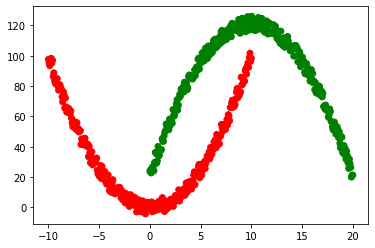

In [15]:
x,y = curve_shapes(300)
x=x.T

# use colormap
colormap = np.array(['r', 'g'])
 
# depict illustration
plt.scatter(x[0], x[1],c=colormap[y])
plt.show()

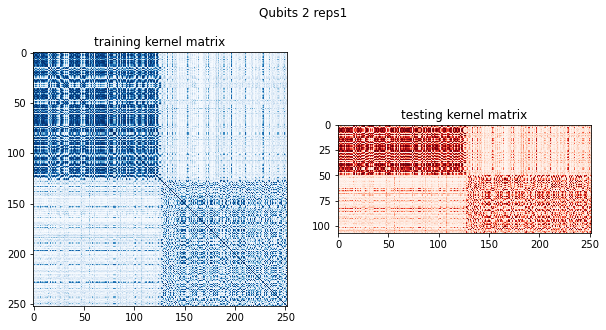

1.0 1.0


In [10]:
_,_,q_score, svc_score = make_experiment(backend, digits_dataset, 2, reps=1, entanglement="full", sort=True, draw=True, classic_svc=True)
print(q_score, svc_score)

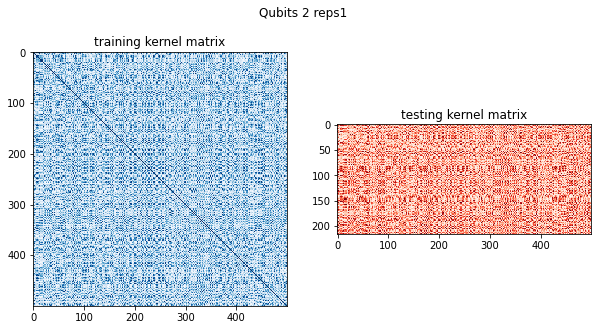

0.5953488372093023 0.5674418604651162


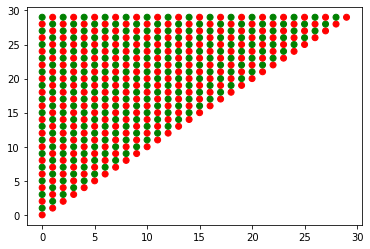

In [11]:
_,_,q_score, svc_score = make_experiment(backend, lambda : generate_mod_2(10, 4), 2, reps=1, entanglement="full", sort=True, draw=True, classic_svc=True)
print(q_score, svc_score)

x,y = generate_mod_2(30)
x=x.T

# use colormap
colormap = np.array(['r', 'g'])
 
# depict illustration
plt.scatter(x[0], x[1],c=colormap[y])
plt.show()

In [12]:
from tqdm.notebook  import tqdm
import seaborn as sns

def build_matrix_for_experiment(dataset, qubits_max = 7, reps_max = 5, feature_map='ZZFeatureMap', **kwargs):
    x, _ = dataset()
    _, w = x.shape

    qubits_r = list(range(2, min(w, qubits_max)+1))
    rep_r    = list(range(1, reps_max+1))

    results = []
    svc_results = []

    best_q, best_r, best_acc = None, None, 0
    best_q_svc, best_acc_svc = None, 0


    for q in tqdm(qubits_r, desc="Qubits"):
        results_per_qubit =[]
        for r in tqdm(rep_r, desc="Reps", leave=False):
            _, _, acc, svc = make_experiment(backend, dataset, q, reps=r, feature_map=feature_map, classic_svc=r==rep_r[0], **kwargs)
            results_per_qubit.append(acc)
            if acc > best_acc:
                best_acc = acc
                best_q = q
                best_r = r
            if svc is not None:
                svc_results.append(svc)
                if svc > best_acc_svc:
                    best_q_svc = q
                    best_acc_svc= svc

        results.append(results_per_qubit)
        
    
    ax = sns.heatmap(np.asmatrix(results), annot=True, cmap='Blues', xticklabels=list(rep_r), yticklabels=list(qubits_r))

    ax.set_title('Accuracy per combination of parameters QSVC');
    ax.set_xlabel('Reps');
    ax.set_ylabel('Qubits')

    plt.show()

    ax = sns.heatmap(np.asmatrix(svc_results), annot=True, cmap='Blues', xticklabels=list(qubits_r))

    ax.set_title('Accuracy per combination of parameters SVC');
    ax.set_xlabel('Qubits');
    # ax.set_ylabel('Qubits')
    plt.show()


    print(f'Best QSVM {best_acc} (q: {best_q}, r: {best_r}) best SVM {best_acc_svc} (q {best_q_svc})')

    return best_q, best_r

In [13]:
def compare_best_results(dataset, **kwargs):
    best_q, best_r = build_matrix_for_experiment(dataset, **kwargs)
    make_experiment(backend, dataset, best_q, reps=best_r, sort=True, draw=True, classic_svc=False, **kwargs)


digits_dataset
digits_dataset ZZFeatureMap linear


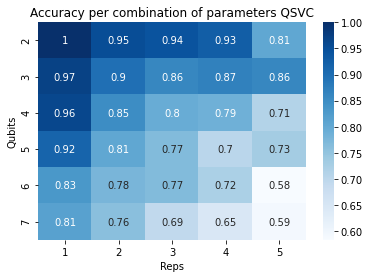

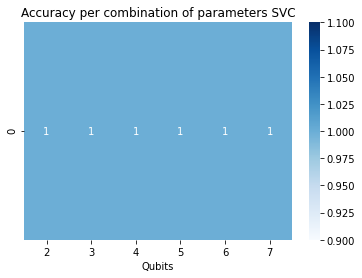

Best QSVM 1.0 (q: 2, r: 1) best SVM 1.0 (q 2)


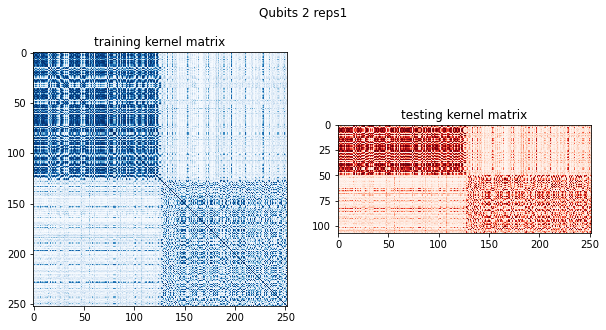

digits_dataset ZZFeatureMap circular


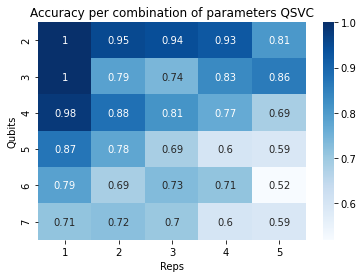

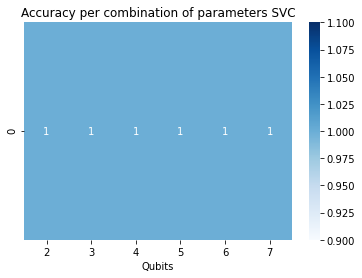

Best QSVM 1.0 (q: 2, r: 1) best SVM 1.0 (q 2)


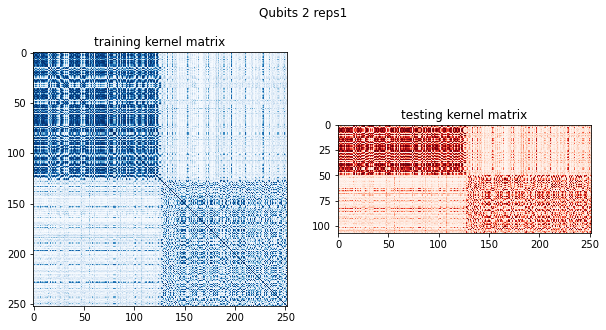

digits_dataset ZZFeatureMap full


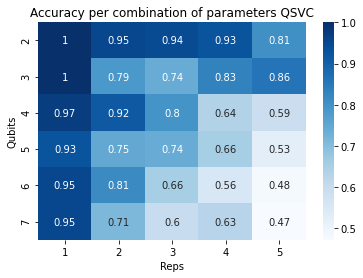

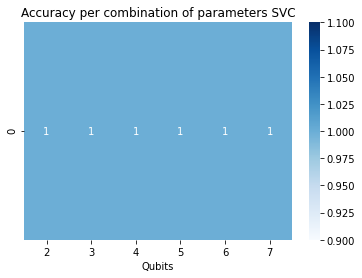

Best QSVM 1.0 (q: 2, r: 1) best SVM 1.0 (q 2)


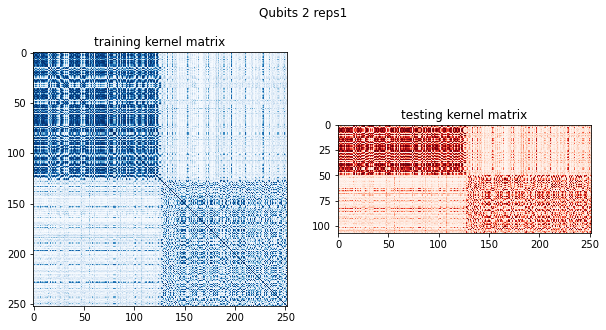

cancer_dataset
cancer_dataset ZZFeatureMap linear


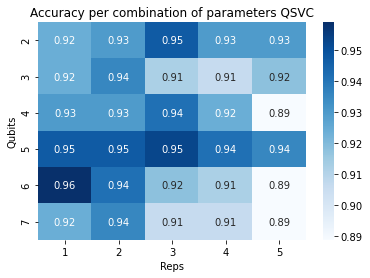

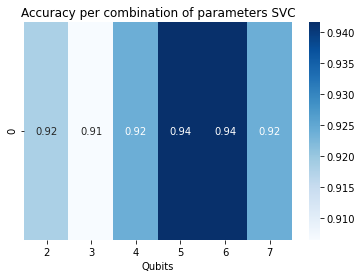

Best QSVM 0.9590643274853801 (q: 6, r: 1) best SVM 0.9415204678362573 (q 5)


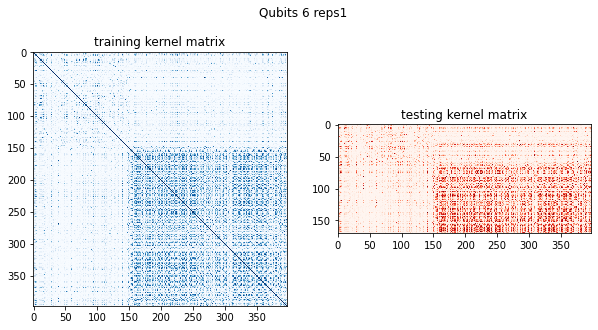

cancer_dataset ZZFeatureMap circular


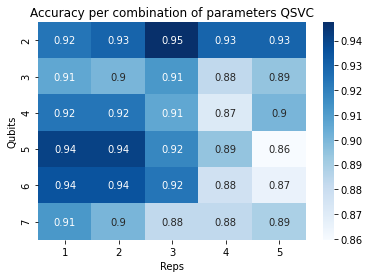

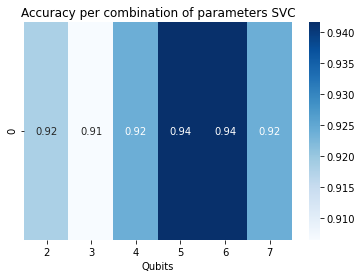

Best QSVM 0.9473684210526315 (q: 2, r: 3) best SVM 0.9415204678362573 (q 5)


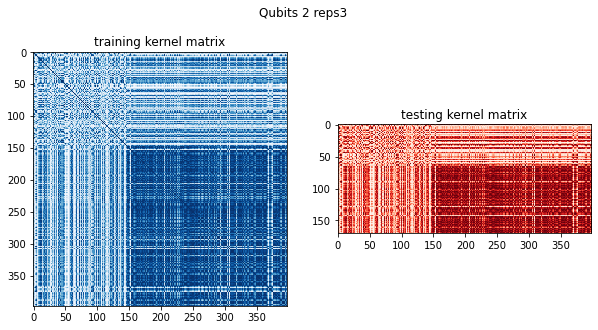

cancer_dataset ZZFeatureMap full


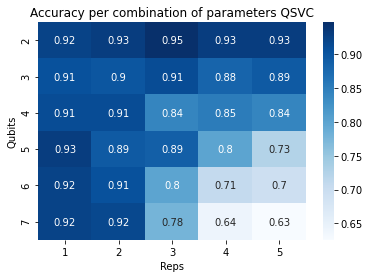

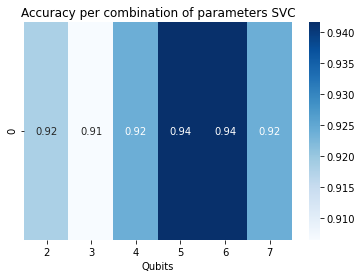

Best QSVM 0.9473684210526315 (q: 2, r: 3) best SVM 0.9415204678362573 (q 5)


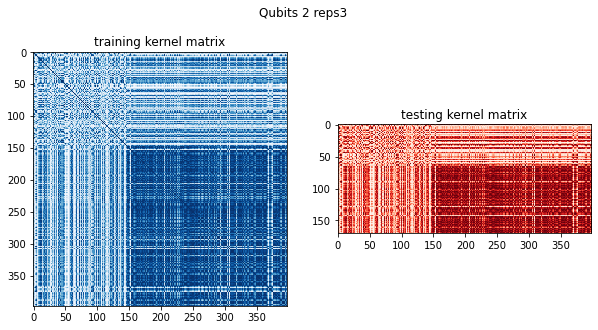

generate 16,2
generate 16,2 ZZFeatureMap linear


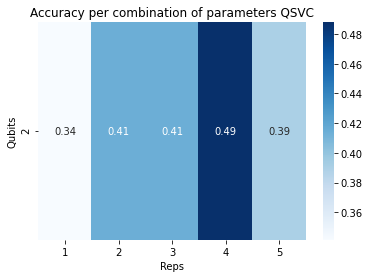

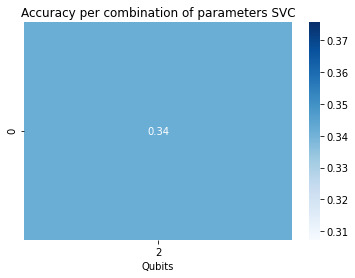

Best QSVM 0.4878048780487805 (q: 2, r: 4) best SVM 0.34146341463414637 (q 2)


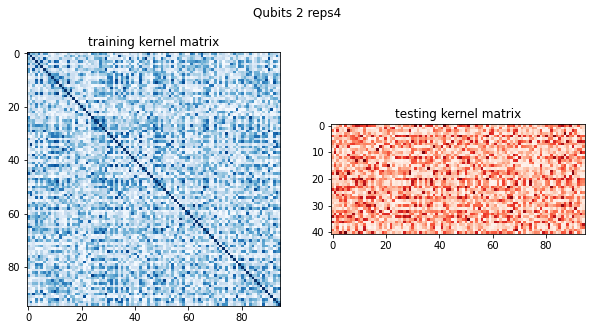

generate 16,2 ZZFeatureMap circular


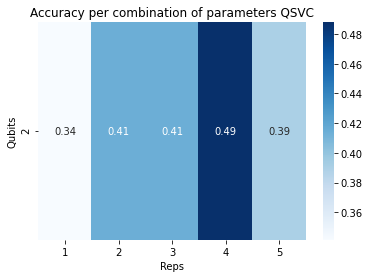

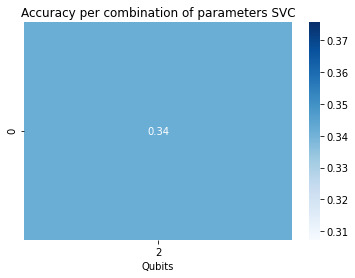

Best QSVM 0.4878048780487805 (q: 2, r: 4) best SVM 0.34146341463414637 (q 2)


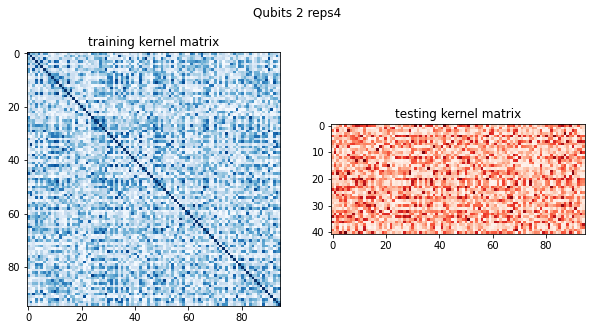

generate 16,2 ZZFeatureMap full


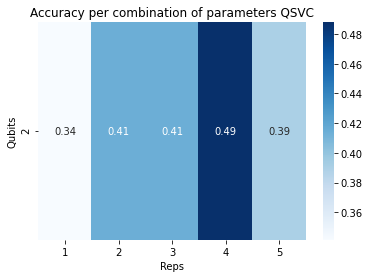

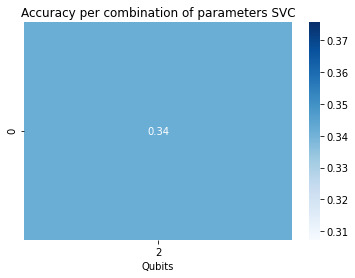

Best QSVM 0.4878048780487805 (q: 2, r: 4) best SVM 0.34146341463414637 (q 2)


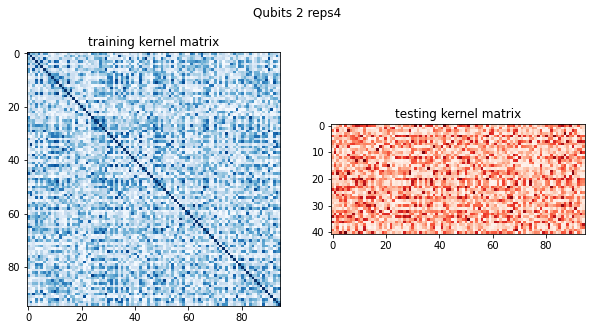

generate 14,3
generate 14,3 ZZFeatureMap linear


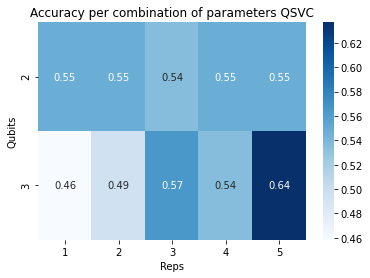

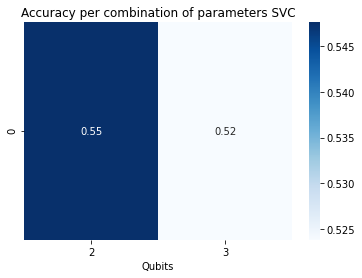

Best QSVM 0.6369047619047619 (q: 3, r: 5) best SVM 0.5476190476190477 (q 2)


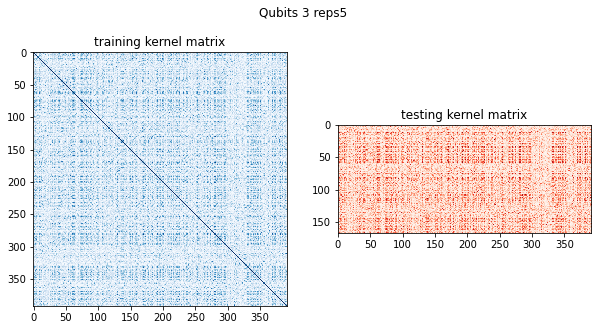

generate 14,3 ZZFeatureMap circular


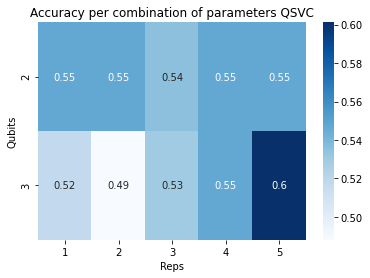

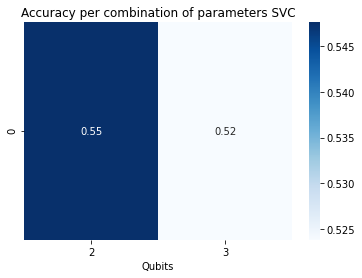

Best QSVM 0.6011904761904762 (q: 3, r: 5) best SVM 0.5476190476190477 (q 2)


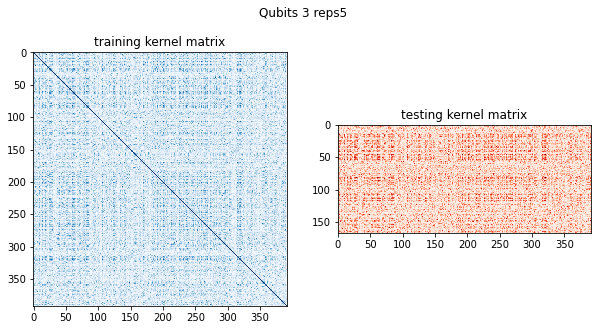

generate 14,3 ZZFeatureMap full


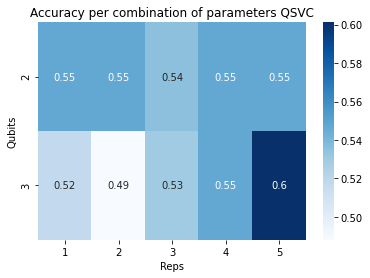

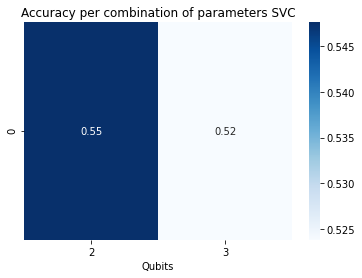

Best QSVM 0.6011904761904762 (q: 3, r: 5) best SVM 0.5476190476190477 (q 2)


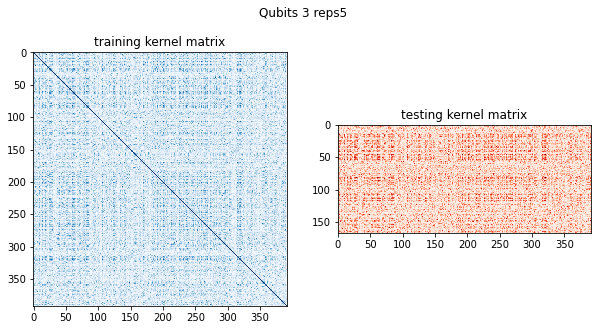

generate 12,4
generate 12,4 ZZFeatureMap linear


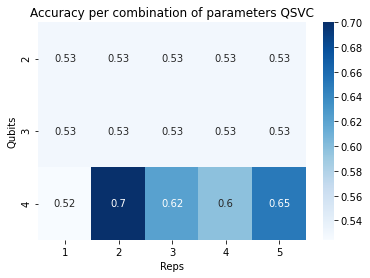

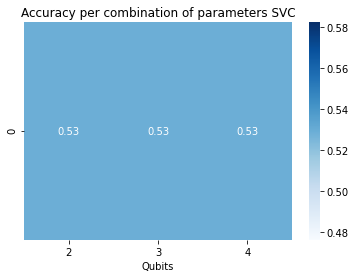

Best QSVM 0.7 (q: 4, r: 2) best SVM 0.5292682926829269 (q 2)


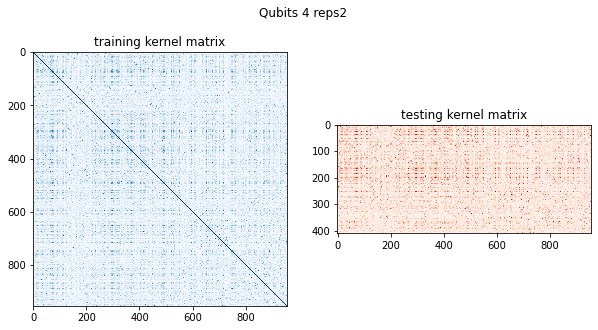

generate 12,4 ZZFeatureMap circular


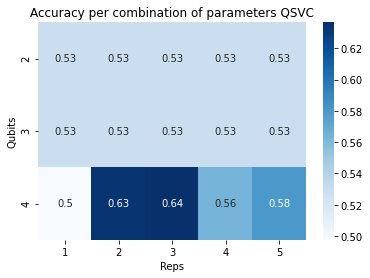

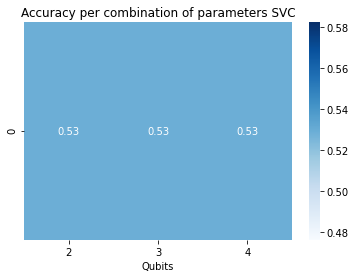

Best QSVM 0.6365853658536585 (q: 4, r: 3) best SVM 0.5292682926829269 (q 2)


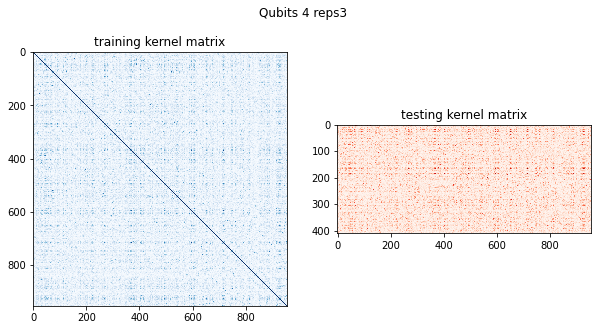

generate 12,4 ZZFeatureMap full


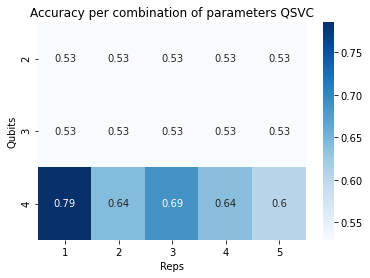

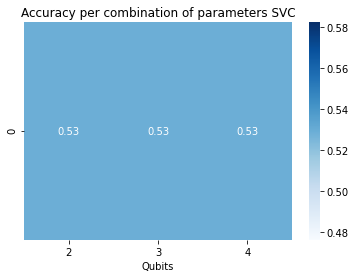

Best QSVM 0.7853658536585366 (q: 4, r: 1) best SVM 0.5292682926829269 (q 2)


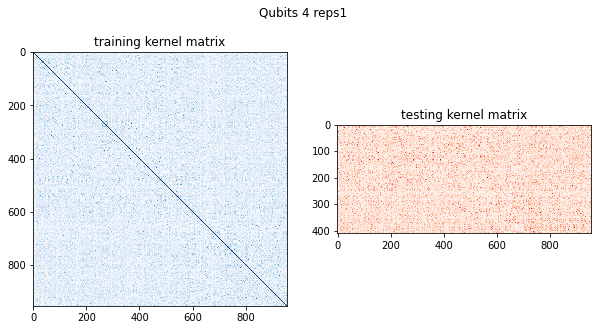

curve_shapes 300
curve_shapes 300 ZZFeatureMap linear


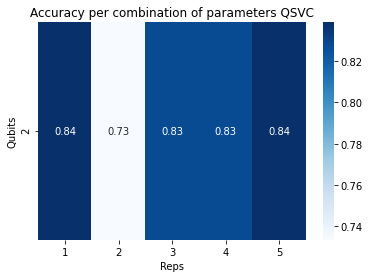

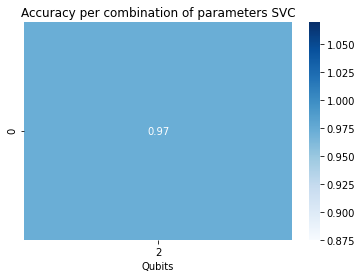

Best QSVM 0.8388888888888889 (q: 2, r: 1) best SVM 0.9722222222222222 (q 2)


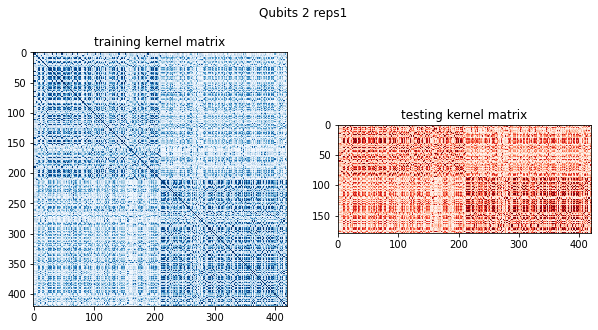

curve_shapes 300 ZZFeatureMap circular


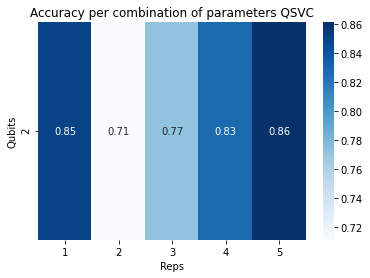

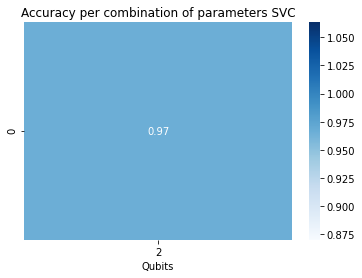

Best QSVM 0.8611111111111112 (q: 2, r: 5) best SVM 0.9666666666666667 (q 2)


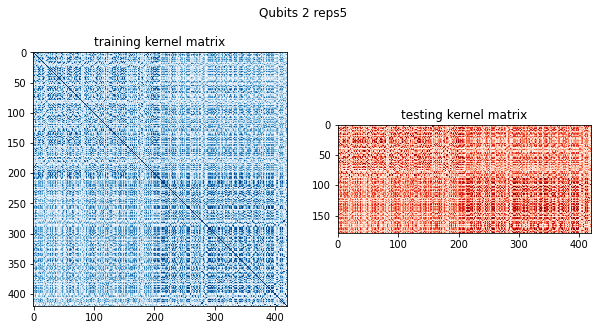

curve_shapes 300 ZZFeatureMap full


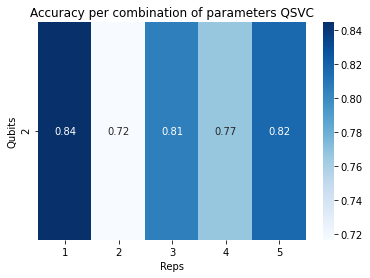

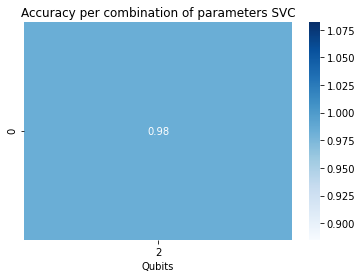

Best QSVM 0.8444444444444444 (q: 2, r: 1) best SVM 0.9833333333333333 (q 2)


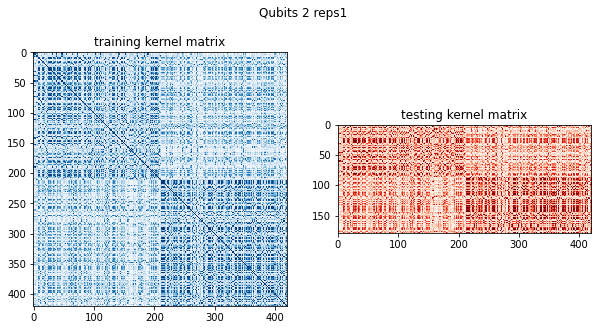

blobs 400,2
blobs 400,2 ZZFeatureMap linear


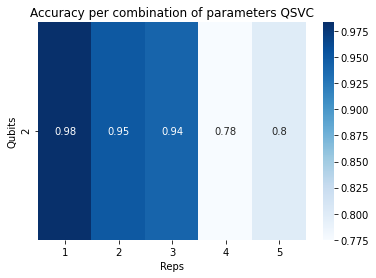

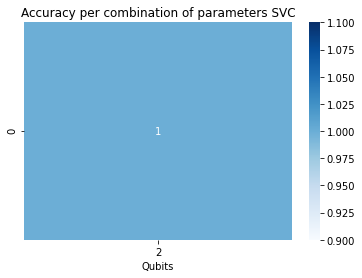

Best QSVM 0.9833333333333333 (q: 2, r: 1) best SVM 1.0 (q 2)


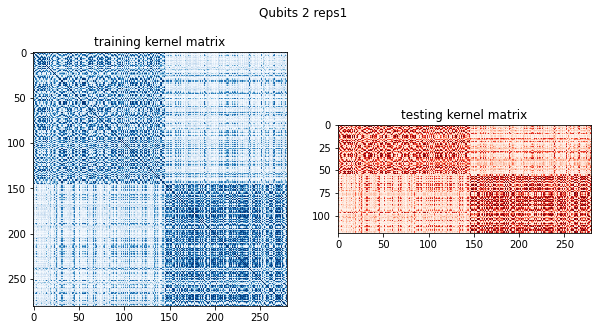

blobs 400,2 ZZFeatureMap circular


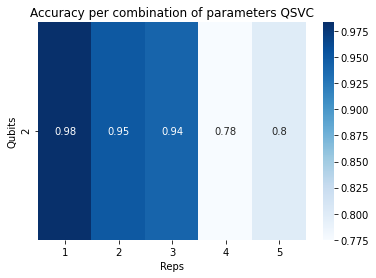

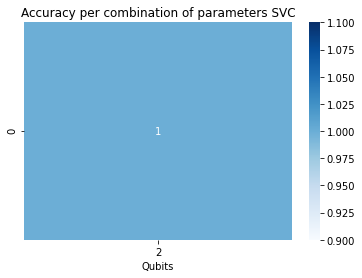

Best QSVM 0.9833333333333333 (q: 2, r: 1) best SVM 1.0 (q 2)


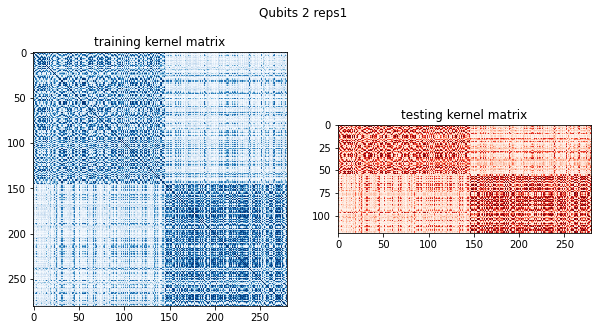

blobs 400,2 ZZFeatureMap full


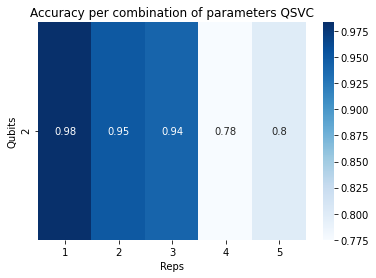

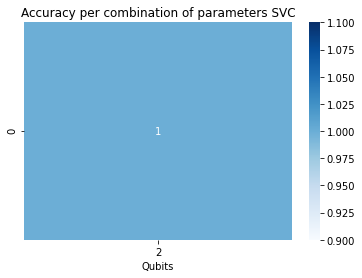

Best QSVM 0.9833333333333333 (q: 2, r: 1) best SVM 1.0 (q 2)


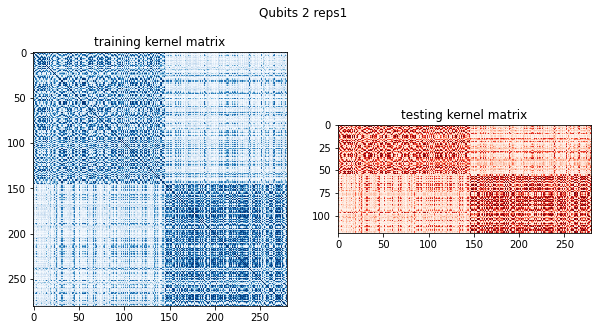

blobs 400,4
blobs 400,4 ZZFeatureMap linear


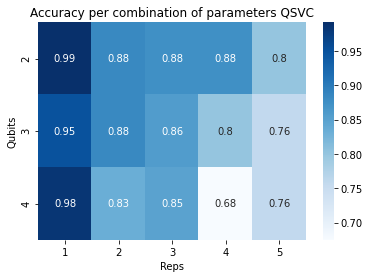

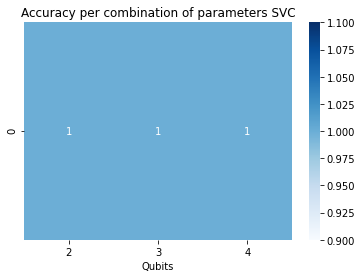

Best QSVM 0.9916666666666667 (q: 2, r: 1) best SVM 1.0 (q 2)


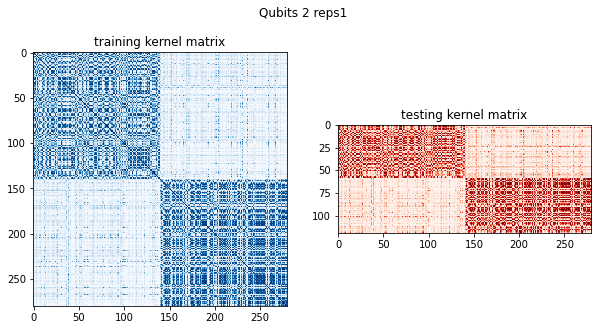

blobs 400,4 ZZFeatureMap circular


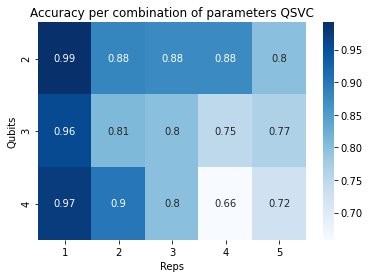

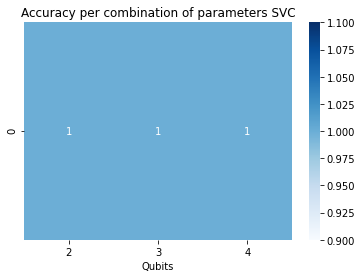

Best QSVM 0.9916666666666667 (q: 2, r: 1) best SVM 1.0 (q 2)


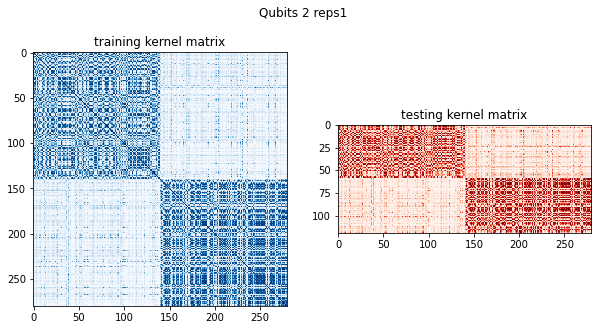

blobs 400,4 ZZFeatureMap full


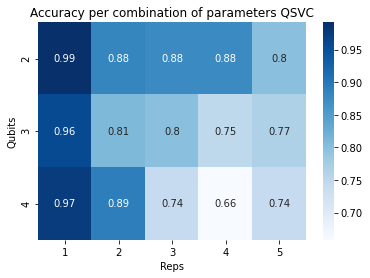

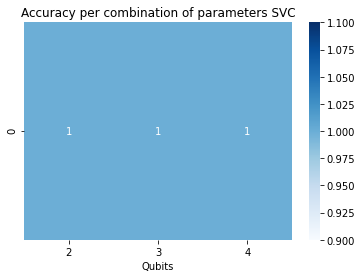

Best QSVM 0.9916666666666667 (q: 2, r: 1) best SVM 1.0 (q 2)


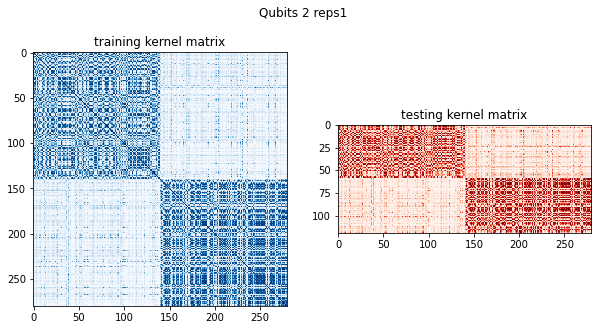

blobs 400,6
blobs 400,6 ZZFeatureMap linear


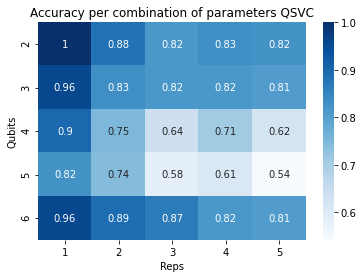

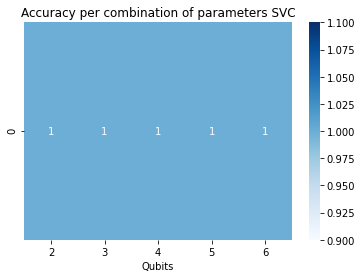

Best QSVM 1.0 (q: 2, r: 1) best SVM 1.0 (q 2)


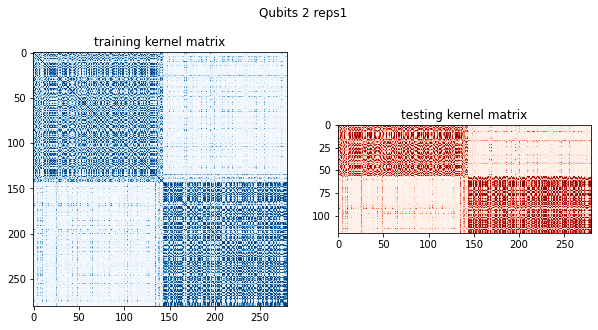

blobs 400,6 ZZFeatureMap circular


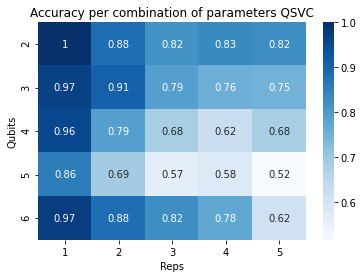

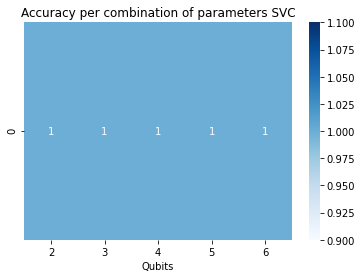

Best QSVM 1.0 (q: 2, r: 1) best SVM 1.0 (q 2)


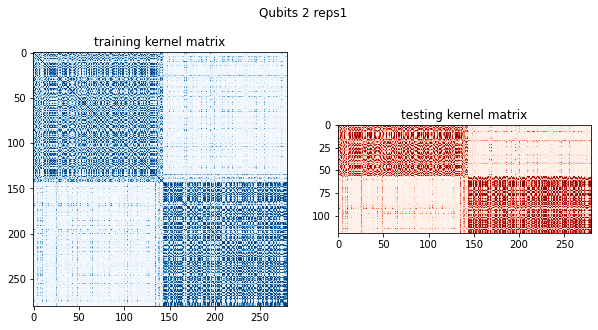

blobs 400,6 ZZFeatureMap full


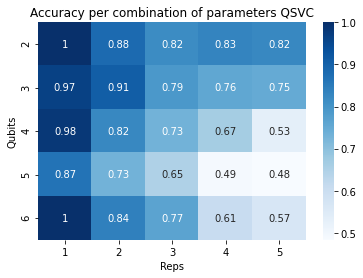

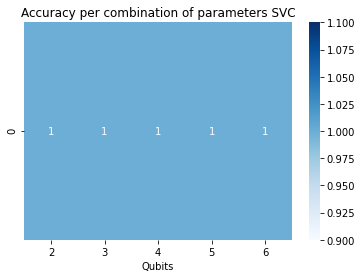

Best QSVM 1.0 (q: 2, r: 1) best SVM 1.0 (q 2)


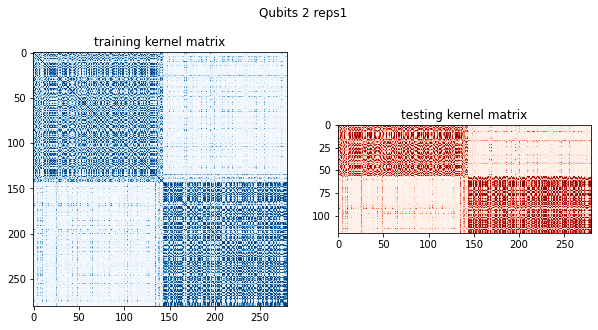

blobs 400,8
blobs 400,8 ZZFeatureMap linear


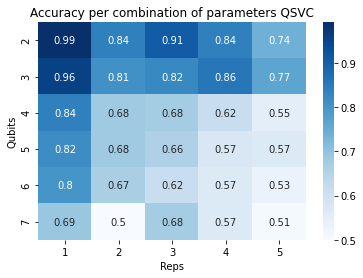

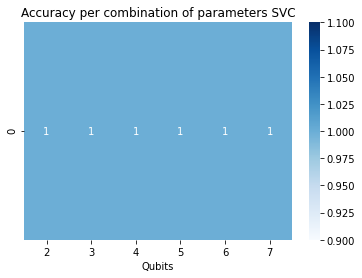

Best QSVM 0.9916666666666667 (q: 2, r: 1) best SVM 1.0 (q 2)


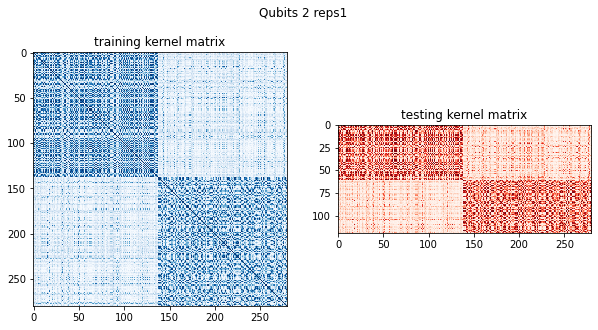

blobs 400,8 ZZFeatureMap circular


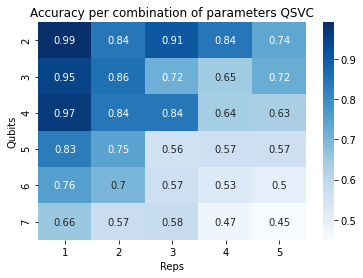

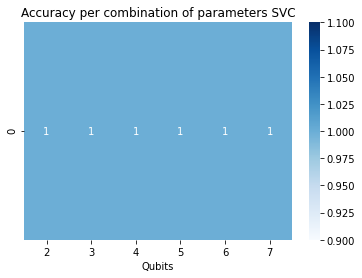

Best QSVM 0.9916666666666667 (q: 2, r: 1) best SVM 1.0 (q 2)


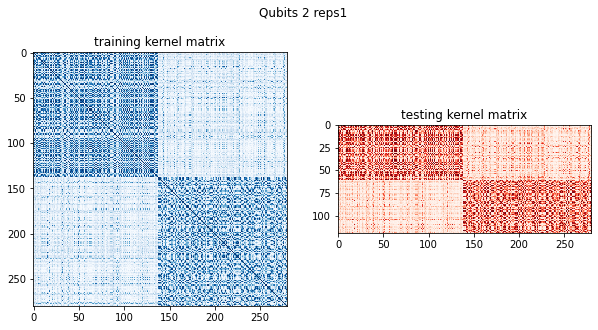

blobs 400,8 ZZFeatureMap full


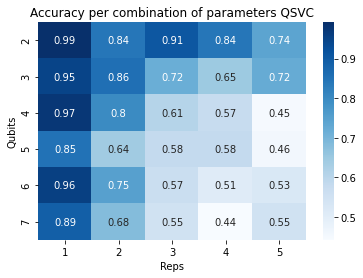

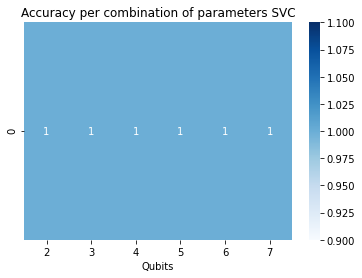

Best QSVM 0.9916666666666667 (q: 2, r: 1) best SVM 1.0 (q 2)


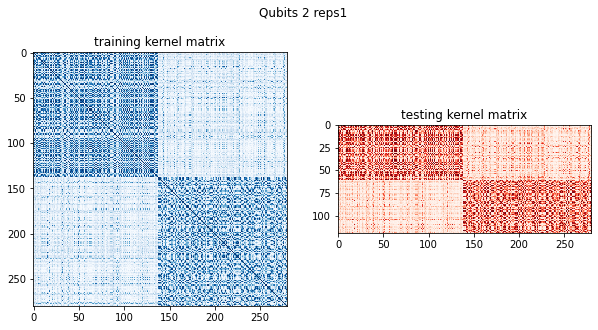

circles 600
circles 600 ZZFeatureMap linear


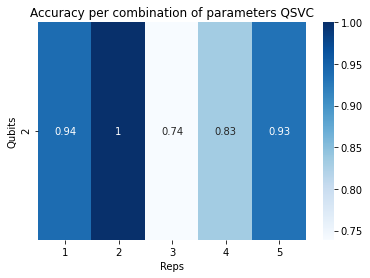

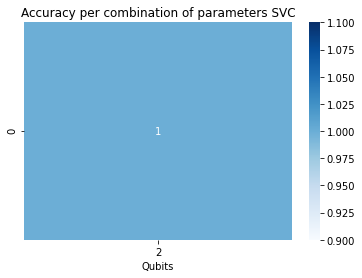

Best QSVM 1.0 (q: 2, r: 2) best SVM 1.0 (q 2)


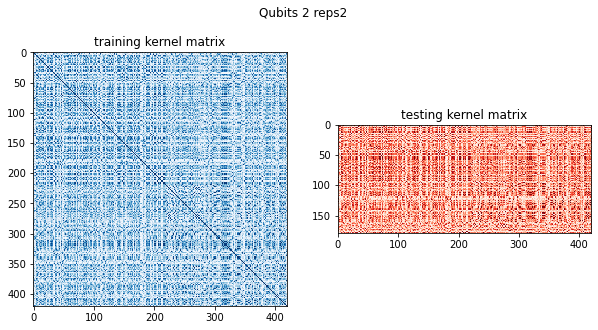

circles 600 ZZFeatureMap circular


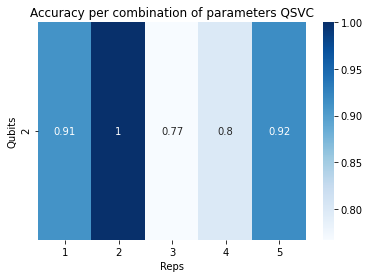

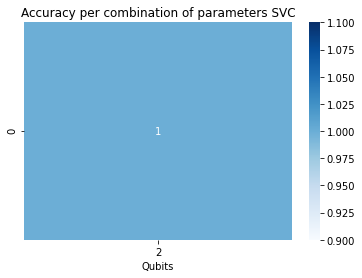

Best QSVM 1.0 (q: 2, r: 2) best SVM 1.0 (q 2)


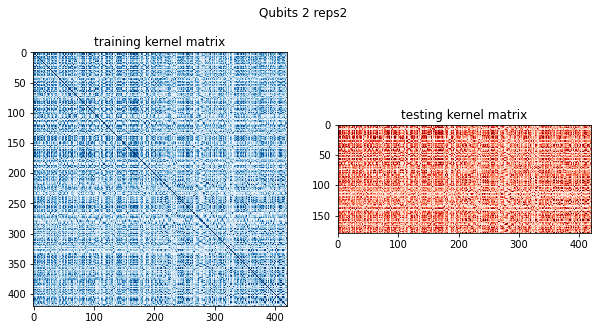

circles 600 ZZFeatureMap full


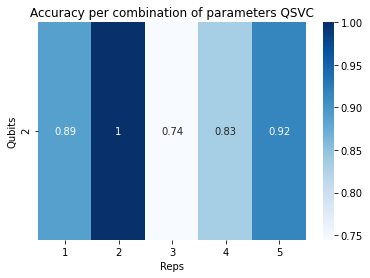

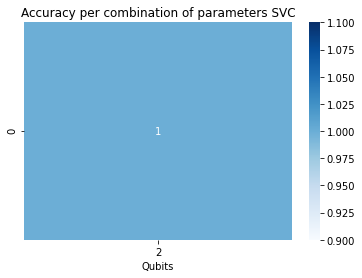

Best QSVM 1.0 (q: 2, r: 2) best SVM 1.0 (q 2)


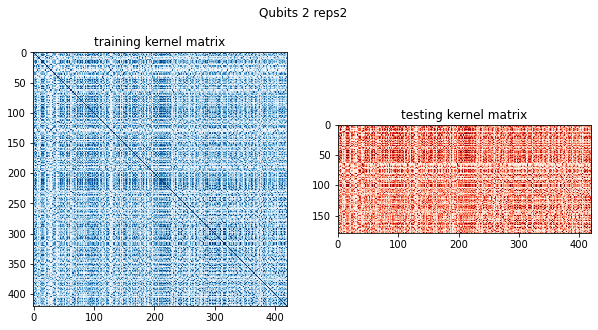

In [14]:
for name, dataset in all_datasets:
    print(name)
    for feature_map in ["ZZFeatureMap"]:
        for entanglement in ['linear', 'circular', 'full']:
            print(name, feature_map, entanglement)
            compare_best_results(dataset, feature_map=feature_map,entanglement=entanglement)